In [1]:
%load_ext autoreload
%autoreload 2

# Imports

In [2]:
import numpy as np
import jax
import jax.numpy as jnp
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import diffrax as dfx
from typing import List

from functools import partial
import os
import sys

jax.config.update('jax_platform_name', 'gpu')

if __package__ is None:

    module_path = os.path.abspath(os.path.join('..'))
    sys.path.append(module_path)

    __package__ = os.path.basename(module_path)


# jupyter nbconvert --to notebook --execute 23_Monte_Carlo_adaptability_2.ipynb --output=23_Monte_Carlo_adaptability_2_large.ipynb --ExecutePreprocessor.timeout=-1
np.random.seed(0)
jax.devices()

[cuda(id=0), cuda(id=1)]

In [3]:
from synbio_morpher.srv.parameter_prediction.simulator import make_piecewise_stepcontrol
from synbio_morpher.utils.misc.type_handling import flatten_listlike
from synbio_morpher.utils.modelling.physical import eqconstant_to_rates, equilibrium_constant_reparameterisation
from synbio_morpher.utils.modelling.deterministic import bioreaction_sim_dfx_expanded
from synbio_morpher.utils.modelling.solvers import get_diffrax_solver, make_stepsize_controller, simulate_steady_states
from synbio_morpher.utils.results.analytics.timeseries import calculate_adaptation, compute_peaks, compute_adaptability_full


# Set up test circuits

In [ ]:
def make_species_bound(species_unbound):
    return sorted(set(flatten_listlike([['-'.join(sorted([x, y])) for x in species_unbound] for y in species_unbound])))


# RNA circuit settings
species_unbound = ['RNA_0', 'RNA_1', 'RNA_2']
species_bound = make_species_bound(species_unbound)
species = species_unbound + species_bound
species_signal = ['RNA_0']
species_output = ['RNA_2']
# species_output = ['RNA_1', 'RNA_2']
species_nonsignal = [s for s in species_unbound if s not in species_signal]
idxs_signal = np.array([species.index(s) for s in species_signal])
idxs_output = np.array([species.index(s) for s in species_output])
idxs_unbound = np.array([species.index(s) for s in species_unbound])
idxs_bound = np.array([species.index(s) for s in species_bound])
signal_onehot = np.array([1 if s in idxs_signal else 0 for s in np.arange(len(species))])

# Dynamic Simulation parameters
k_a = 0.00150958097
signal_target = 2
t0 = 0
t1 = 3000
ts = np.linspace(t0, t1, 500)
tmax = 1000
dt0 = 0.005555558569638981
dt1_factor = 5
dt1 = dt0 * dt1_factor
max_steps = 16**4 * 10
use_sensitivity_func1 = False
sim_method = 'Dopri5'
stepsize_controller = 'adaptive'
threshold_steady_state = 0.01
batch_size = 70000

# MC parameters
total_steps = 20
total_samples = 6000
choose_max = int(total_samples * 0.1)
diversity = 0.2  # Sensitivity max to add into next chosen circuits
mutation_scale = 0.1
n_circuits_display = 30
N0 = 200
y00 = np.array([[N0] * len(species_unbound) + [0] * len(species_bound)]).astype(np.float32)
y00 = np.repeat(y00, repeats=total_samples, axis=0)

# Reactions
energies = np.random.rand(total_samples, len(np.tril_indices(len(species_unbound))[0]))
energies = np.interp(energies, (energies.min(), energies.max()), (-25, 0))
eqconstants = jax.vmap(partial(equilibrium_constant_reparameterisation, initial=N0))(energies)
forward_rates, reverse_rates = eqconstant_to_rates(eqconstants, k_a)
# forward_rates = np.array(list(map(lambda r: r[np.triu_indices(len(species_unbound))], forward_rates)))
forward_rates = forward_rates[0]
# reverse_rates = np.array(list(map(lambda r: r[np.triu_indices(len(species_unbound))], reverse_rates)))

inputs = np.array([
    [2, 0, 0, 0, 0, 0, 0, 0, 0],
    [1, 1, 0, 0, 0, 0, 0, 0, 0],
    [1, 0, 1, 0, 0, 0, 0, 0, 0],
    [0, 2, 0, 0, 0, 0, 0, 0, 0],
    [0, 1, 1, 0, 0, 0, 0, 0, 0],
    [0, 0, 2, 0, 0, 0, 0, 0, 0],
], dtype=np.float64)
outputs = np.array([
    [0, 0, 0, 1, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 1, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 1, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 1, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 1],
], dtype=np.float64)

# Initialise simulations

In [5]:
sim_func = jax.jit(jax.vmap(
    partial(bioreaction_sim_dfx_expanded,
            t0=t0, t1=t1, dt0=dt0,
            forward_rates=forward_rates,
            inputs=inputs,
            outputs=outputs,
            solver=get_diffrax_solver(
                sim_method),
            saveat=dfx.SaveAt(
                ts=jnp.linspace(t0, t1, 500)),  # int(np.min([500, t1-t0]))))
            stepsize_controller=make_stepsize_controller(t0, t1, dt0, dt1,
                                                         choice=stepsize_controller)
            )))
# sol_steady_states = jax.vmap(bioreaction_sim_dfx_expanded)(y00, reverse_rates)
# y01 = np.array(sol_steady_states.ys[:, -1])
# y01[:, np.array(idxs_signal)] = y01[:, np.array(idxs_signal)] * signal_target
# sol_signal = jax.vmap(bioreaction_sim_dfx_expanded)(y01, reverse_rates)

# Monte Carlo iterations

In [6]:
run_mc = True

In [7]:
def choose_next(sol, idxs_signal, idxs_output, use_sensitivity_func1: bool, choose_max: int, total_samples: int, diversity=0.):
    """ Choose circuits with highest adaptability """
    
    def get_next_idxs(analytic, n_chosen):
        idxs_next = jnp.where(jnp.sort(jnp.nanmax(analytic[:, idxs_output], axis=1))[
                            -n_chosen:].min() <= analytic[:, idxs_output])[0]
        return idxs_next[:n_chosen]
    
    def get_next_idxs_diversity(choose_max, diversity, adaptability, sensitivity, total_samples):
        n_chosen_a = int(np.ceil(choose_max * (1 - diversity)))
        n_chosen_s = int(np.floor(choose_max * diversity))
        idxs_next_a, idxs_next_s = (jnp.array([]), jnp.array([]))
        if n_chosen_a:
            idxs_next_a = get_next_idxs(adaptability, n_chosen_a)
        if n_chosen_s:
            idxs_next_s = get_next_idxs(sensitivity, n_chosen_s)
        # idxs_next_p = get_next_idxs(precision, int(np.floor(choose_max * diversity / 2)))
        idxs_next = jnp.unique(jnp.concatenate([idxs_next_a, idxs_next_s]))
        i_while = 0
        while len(idxs_next) < choose_max:
            if len(adaptability) == 0:
                idxs_rnd = choose_next_rnd(choose_max - len(idxs_next), total_samples)
                idxs_next = jnp.concatenate([idxs_next, idxs_rnd])
            else:
                idxs_next = jnp.concatenate([idxs_next, get_next_idxs(adaptability, choose_max - len(idxs_next))])
            i_while += 1
            if i_while > 10:
                print('While loop was going forever...')
                break
        return idxs_next

    ys0, ys1 = sol
    adaptability, sensitivity, precision = jax.vmap(partial(
        compute_adaptability_full, idx_sig=idxs_signal, use_sensitivity_func1=use_sensitivity_func1))(ys0, ys1)
    # idxs_next = jnp.argsort(adaptability[:, idxs_output], axis=0)[-choose_max:]
    if diversity:
        idxs_next = get_next_idxs_diversity(choose_max, diversity, adaptability, sensitivity, total_samples)
    else:
        idxs_next = get_next_idxs(adaptability, choose_max)
        
    if len(idxs_next) == 0:
        print('Not sure how this happened...')
        idxs_next = choose_next_rnd(choose_max - len(idxs_next), total_samples)
        
    return idxs_next.astype(jnp.int32), adaptability, sensitivity, precision


def choose_next_rnd(n_choose, total_samples):
    return jax.random.randint(jax.random.PRNGKey(0), (n_choose,), 0, total_samples)


def mutate_expand(parents: jnp.ndarray, n_samples_per_parent, mutation_scale):
    min_param = parents.min()
    # Generate mutated samples from each parent
    mutated = jax.tree_util.tree_map(
                            lambda x: x + x * mutation_scale * np.random.randn(n_samples_per_parent, *x.shape), parents)
    mutated_nonzero = jnp.where(mutated < min_param, min_param, mutated)

    return mutated_nonzero.reshape(mutated_nonzero.shape[0] * mutated_nonzero.shape[1], *mutated_nonzero.shape[2:])


def simulate(y00, reverse_rates, sim_func, t0, t1, tmax, batch_size, threshold):
    
    def join_results(xs, xsb):
        if xs is None:
            xs = xsb
        else:
            xs = jnp.concatenate([xs, xsb], axis=0)
        return xs
    
    ys0, ts0, ys1, ts1 = [None] * 4
    for i, batch_step in enumerate(range(0, len(reverse_rates), batch_size)):
        i0, i1 = batch_step, jnp.minimum(batch_step + batch_size, len(reverse_rates))
        print(f'Simulating batch {i}: {i0} to {i1} / {len(reverse_rates)}')
        y00b, reverse_rates_b = y00[i0:i1], reverse_rates[i0:i1]
        ys0b, ts0b, ys1b, ts1b = simulate_core(y00b, reverse_rates_b, sim_func, t0, t1, tmax, threshold)
        
        # for xs, xsb in zip([ys0, ts0, ys1, ts1], [ys0b, ts0b, ys1b, ts1b]):
        ys0 = join_results(ys0, ys0b)
        ts0 = join_results(ts0, ts0b)
        ys1 = join_results(ys1, ys1b)
        ts1 = join_results(ts1, ts1b)
    
    return ys0, ts0, ys1, ts1
    
    
def simulate_core(y00, reverse_rates, sim_func, t0, t1, tmax, threshold):
    ys0, ts0 = simulate_steady_states(
        y0=y00, total_time=tmax, sim_func=sim_func,
        t0=t0, t1=t1,
        threshold=threshold,
        reverse_rates=reverse_rates,
    )
    y01 = np.array(ys0[:, -1])
    y01[:, np.array(idxs_signal)] = y01[:, np.array(
        idxs_signal)] * signal_target
    ys1, ts1 = simulate_steady_states(
        y0=y01, total_time=tmax, sim_func=sim_func,
        t0=t0, t1=t1,
        threshold=threshold,
        reverse_rates=reverse_rates,
    )
    return ys0, ts0, ys1, ts1



Starting iteration 1 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  720  left to steady out.  0:00:42.293965


Done:  0:01:23.262907


Steady states:  500  iterations.  193  left to steady out.  0:00:40.714011


Done:  0:01:18.863874
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  831  left to steady out.  0:00:41.582545


Done:  0:01:24.986533


Steady states:  500  iterations.  250  left to steady out.  0:00:48.982416


Done:  0:01:30.899397
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  755  left to steady out.  0:00:41.681935


Done:  0:01:28.016870


Steady states:  500  iterations.  213  left to steady out.  0:00:40.164121


Done:  0:01:23.336345
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  808  left to steady out.  0:00:41.311097


Done:  0:01:23.205504


Steady states:  500  iterations.  211  left to steady out.  0:00:40.999283


Done:  0:01:20.386875
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  868  left to steady out.  0:00:40.166833


Done:  0:01:25.896807


Steady states:  500  iterations.  239  left to steady out.  0:00:38.694397


Done:  0:01:16.335751
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  728  left to steady out.  0:00:42.611391


Done:  0:01:26.174674


Steady states:  500  iterations.  238  left to steady out.  0:00:44.428155


Done:  0:01:26.874602
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  711  left to steady out.  0:00:43.458186


Done:  0:01:26.901263


Steady states:  500  iterations.  221  left to steady out.  0:00:43.276203


Done:  0:01:24.511314
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  739  left to steady out.  0:00:40.821443


Done:  0:01:21.500190


Steady states:  500  iterations.  205  left to steady out.  0:00:37.491509


Done:  0:01:20.111408
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  742  left to steady out.  0:00:41.166590


Done:  0:01:30.108282


Steady states:  500  iterations.  220  left to steady out.  0:00:51.585337


Done:  0:01:43.030267
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  689  left to steady out.  0:00:40.042145


Done:  0:01:25.430459


Steady states:  500  iterations.  221  left to steady out.  0:00:43.223870


Done:  0:01:27.424841
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  874  left to steady out.  0:00:42.009449


Done:  0:01:24.637179


Steady states:  500  iterations.  264  left to steady out.  0:00:42.169993


Done:  0:01:22.488205
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  727  left to steady out.  0:00:41.616106


Done:  0:01:20.171254


Steady states:  500  iterations.  213  left to steady out.  0:00:41.345017


Done:  0:01:41.122052


While loop was going forever...
Not sure how this happened...


Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 2 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  765  left to steady out.  0:00:42.796676


Done:  0:01:24.995095


Steady states:  500  iterations.  220  left to steady out.  0:00:40.812531


Done:  0:01:25.394241
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  845  left to steady out.  0:00:41.213465


Done:  0:01:31.377623


Steady states:  500  iterations.  251  left to steady out.  0:00:42.191851


Done:  0:01:26.690209


Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  748  left to steady out.  0:00:43.203951


Done:  0:01:24.958893


Steady states:  500  iterations.  227  left to steady out.  0:00:41.158160


Done:  0:01:19.132659


Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  859  left to steady out.  0:00:42.337702


Done:  0:01:34.617631


Steady states:  500  iterations.  256  left to steady out.  0:00:47.765577


Done:  0:01:37.684805
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  763  left to steady out.  0:00:42.243000


Done:  0:01:23.844543


Steady states:  500  iterations.  228  left to steady out.  0:00:41.212262


Done:  0:01:25.054017
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  798  left to steady out.  0:00:42.296994


Done:  0:01:22.900000


Steady states:  500  iterations.  221  left to steady out.  0:00:41.344256


Done:  0:01:28.030739
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  831  left to steady out.  0:00:43.056903


Done:  0:01:25.386118


Steady states:  500  iterations.  228  left to steady out.  0:00:43.770202


Done:  0:01:25.306625
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  824  left to steady out.  0:00:42.854251


Done:  0:01:23.654387


Steady states:  500  iterations.  220  left to steady out.  0:00:42.114641


Done:  0:01:24.245652
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  804  left to steady out.  0:00:43.349095


Done:  0:01:33.883297


Steady states:  500  iterations.  236  left to steady out.  0:00:43.727678


Done:  0:01:29.377607
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  871  left to steady out.  0:00:41.707154


Done:  0:01:22.215782


Steady states:  500  iterations.  222  left to steady out.  0:00:41.411304


Done:  0:01:25.832162
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  798  left to steady out.  0:00:42.483532


Done:  0:01:26.918454


Steady states:  500  iterations.  227  left to steady out.  0:00:43.573233


Done:  0:01:26.869007
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  816  left to steady out.  0:00:44.483674


Done:  0:01:26.465093


Steady states:  500  iterations.  233  left to steady out.  0:00:41.618175


Done:  0:01:24.333661
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 3 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  662  left to steady out.  0:00:42.476865


Done:  0:01:23.779548


Steady states:  500  iterations.  196  left to steady out.  0:00:42.684203


Done:  0:01:24.434518
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  677  left to steady out.  0:00:42.241737


Done:  0:01:24.585235


Steady states:  500  iterations.  170  left to steady out.  0:00:41.332057


Done:  0:01:23.536038
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  677  left to steady out.  0:00:42.116533


Done:  0:01:22.013568


Steady states:  500  iterations.  173  left to steady out.  0:00:38.113534


Done:  0:01:22.697784
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  700  left to steady out.  0:00:42.544177


Done:  0:01:22.909738


Steady states:  500  iterations.  188  left to steady out.  0:00:43.063778


Done:  0:01:33.016006
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  709  left to steady out.  0:00:42.690049


Done:  0:01:22.903915


Steady states:  500  iterations.  215  left to steady out.  0:00:49.005516


Done:  0:01:28.385345
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  654  left to steady out.  0:00:42.613364


Done:  0:01:23.846441


Steady states:  500  iterations.  187  left to steady out.  0:00:41.170005


Done:  0:01:21.513455
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  615  left to steady out.  0:00:42.690234


Done:  0:01:23.696568


Steady states:  500  iterations.  175  left to steady out.  0:00:42.015755


Done:  0:01:23.992413
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  681  left to steady out.  0:00:42.223255


Done:  0:01:25.258182


Steady states:  500  iterations.  176  left to steady out.  0:00:42.215271


Done:  0:01:32.839073
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  656  left to steady out.  0:00:42.871901


Done:  0:01:24.503753


Steady states:  500  iterations.  180  left to steady out.  0:00:47.974836


Done:  0:01:40.323893
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  672  left to steady out.  0:00:42.293900


Done:  0:01:32.412523


Steady states:  500  iterations.  192  left to steady out.  0:00:36.749492


Done:  0:01:27.421102
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  694  left to steady out.  0:00:42.379539


Done:  0:01:29.192122


Steady states:  500  iterations.  239  left to steady out.  0:00:41.343505


Done:  0:01:28.434722
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  699  left to steady out.  0:00:42.697095


Done:  0:01:26.534670


Steady states:  500  iterations.  189  left to steady out.  0:00:38.535521


Done:  0:01:17.094908


While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 4 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  710  left to steady out.  0:00:42.522848


Done:  0:01:22.387224


Steady states:  500  iterations.  201  left to steady out.  0:00:38.886564


Done:  0:01:25.107884
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  724  left to steady out.  0:00:42.471533


Done:  0:01:30.150682


Steady states:  500  iterations.  209  left to steady out.  0:00:39.654625


Done:  0:01:19.274769
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  653  left to steady out.  0:00:42.608629


Done:  0:01:26.876555


Steady states:  500  iterations.  209  left to steady out.  0:00:45.878356


Done:  0:01:36.307166
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  748  left to steady out.  0:00:45.030034


Done:  0:01:22.731955


Steady states:  500  iterations.  225  left to steady out.  0:00:37.004707


Done:  0:01:12.480805
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  693  left to steady out.  0:00:44.926554


Done:  0:01:33.100306


Steady states:  500  iterations.  205  left to steady out.  0:00:42.812695


Done:  0:01:41.140742
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  715  left to steady out.  0:00:42.789984


Done:  0:01:23.862104


Steady states:  500  iterations.  219  left to steady out.  0:00:43.238325


Done:  0:01:29.165483
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  662  left to steady out.  0:00:42.401740


Done:  0:01:26.287930


Steady states:  500  iterations.  210  left to steady out.  0:00:41.342238


Done:  0:01:19.793877
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  651  left to steady out.  0:00:42.341266


Done:  0:01:23.252727


Steady states:  500  iterations.  184  left to steady out.  0:00:39.549186


Done:  0:01:20.235888


Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  737  left to steady out.  0:00:42.537151


Done:  0:01:23.522920


Steady states:  500  iterations.  207  left to steady out.  0:00:43.925626


Done:  0:01:22.886791
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  682  left to steady out.  0:00:44.806032


Done:  0:01:25.038023


Steady states:  500  iterations.  213  left to steady out.  0:00:43.804306


Done:  0:01:25.400866
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  667  left to steady out.  0:00:41.625296


Done:  0:01:22.417589


Steady states:  500  iterations.  201  left to steady out.  0:00:46.678674


Done:  0:01:28.408717
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  692  left to steady out.  0:00:42.339453


Done:  0:01:33.456723


Steady states:  500  iterations.  229  left to steady out.  0:00:43.096738


Done:  0:01:22.941342
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 5 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  659  left to steady out.  0:00:42.090630


Done:  0:01:22.988292


Steady states:  500  iterations.  177  left to steady out.  0:00:38.629214


Done:  0:01:25.347776
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  671  left to steady out.  0:00:42.126376


Done:  0:01:25.809724


Steady states:  500  iterations.  197  left to steady out.  0:00:41.194453


Done:  0:01:22.238454
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  709  left to steady out.  0:00:42.385758


Done:  0:01:22.463016


Steady states:  500  iterations.  214  left to steady out.  0:00:43.714523


Done:  0:01:24.330024
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  710  left to steady out.  0:00:42.751313


Done:  0:01:22.728033


Steady states:  500  iterations.  210  left to steady out.  0:00:39.685351


Done:  0:01:26.852489
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  731  left to steady out.  0:00:39.244408


Done:  0:01:20.705193


Steady states:  500  iterations.  221  left to steady out.  0:00:37.847750


Done:  0:01:24.009515
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  686  left to steady out.  0:00:40.214566


Done:  0:01:23.325593


Steady states:  500  iterations.  187  left to steady out.  0:00:40.674577


Done:  0:01:23.366201
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  710  left to steady out.  0:00:40.356633


Done:  0:01:18.174487


Steady states:  500  iterations.  174  left to steady out.  0:00:48.520893


Done:  0:01:42.246898
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  678  left to steady out.  0:00:40.106127


Done:  0:01:34.601810


Steady states:  500  iterations.  188  left to steady out.  0:00:37.135476


Done:  0:01:22.784556


Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  709  left to steady out.  0:00:44.422578


Done:  0:01:31.643671


Steady states:  500  iterations.  199  left to steady out.  0:00:39.012845


Done:  0:01:24.414290
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  655  left to steady out.  0:00:44.129022


Done:  0:01:27.976824


Steady states:  500  iterations.  187  left to steady out.  0:00:40.310228


Done:  0:01:22.215049
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  736  left to steady out.  0:00:42.652327


Done:  0:01:23.345665


Steady states:  500  iterations.  209  left to steady out.  0:00:40.117370


Done:  0:01:20.999020
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  683  left to steady out.  0:00:42.587356


Done:  0:01:21.558808


Steady states:  500  iterations.  221  left to steady out.  0:00:41.336674


Done:  0:01:22.812252
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 6 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  679  left to steady out.  0:00:40.332252


Done:  0:01:22.601242


Steady states:  500  iterations.  196  left to steady out.  0:00:42.303768


Done:  0:01:23.528570
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  628  left to steady out.  0:00:53.393180


Done:  0:01:32.134359


Steady states:  500  iterations.  207  left to steady out.  0:00:43.001693


Done:  0:01:20.893753
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  636  left to steady out.  0:00:41.788586


Done:  0:01:23.092516


Steady states:  500  iterations.  190  left to steady out.  0:00:48.692035


Done:  0:01:28.097015
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  649  left to steady out.  0:00:38.813652


Done:  0:01:17.644818


Steady states:  500  iterations.  196  left to steady out.  0:00:41.786401


Done:  0:01:27.004937
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  603  left to steady out.  0:00:49.438531


Done:  0:01:29.912567


Steady states:  500  iterations.  179  left to steady out.  0:00:51.265807


Done:  0:01:39.529302
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  659  left to steady out.  0:00:37.901019


Done:  0:01:15.177962


Steady states:  500  iterations.  201  left to steady out.  0:00:45.584865


Done:  0:01:31.099474


Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  668  left to steady out.  0:00:39.005543


Done:  0:01:22.673964


Steady states:  500  iterations.  188  left to steady out.  0:00:50.127499


Done:  0:01:28.556535


Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  636  left to steady out.  0:00:40.322605


Done:  0:01:19.195473


Steady states:  500  iterations.  172  left to steady out.  0:00:38.156422


Done:  0:01:19.509937
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  642  left to steady out.  0:00:40.247579


Done:  0:01:21.401151


Steady states:  500  iterations.  191  left to steady out.  0:00:38.833225


Done:  0:01:21.813586
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  673  left to steady out.  0:00:42.619130


Done:  0:01:21.918928


Steady states:  500  iterations.  189  left to steady out.  0:00:47.506313


Done:  0:01:26.281684
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  657  left to steady out.  0:00:39.261746


Done:  0:01:17.488434


Steady states:  500  iterations.  191  left to steady out.  0:00:41.740824


Done:  0:01:25.497202


Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  672  left to steady out.  0:00:41.826437


Done:  0:01:34.445183


Steady states:  500  iterations.  209  left to steady out.  0:00:50.399798


Done:  0:01:43.178865
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 7 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  659  left to steady out.  0:00:36.948265


Done:  0:01:14.703219


Steady states:  500  iterations.  201  left to steady out.  0:00:58.115317


Done:  0:01:56.730044
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  629  left to steady out.  0:00:38.222655


Done:  0:01:15.046449


Steady states:  500  iterations.  196  left to steady out.  0:00:49.113602


Done:  0:01:41.203829
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  625  left to steady out.  0:00:38.827882


Done:  0:01:15.871505


Steady states:  500  iterations.  191  left to steady out.  0:00:49.435777


Done:  0:01:41.857667
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  630  left to steady out.  0:00:47.383178


Done:  0:01:36.841826


Steady states:  500  iterations.  172  left to steady out.  0:00:39.084273


Done:  0:01:16.984822
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  645  left to steady out.  0:00:42.473740


Done:  0:01:28.717922


Steady states:  500  iterations.  195  left to steady out.  0:00:38.294740


Done:  0:01:20.406628
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  617  left to steady out.  0:00:41.997021


Done:  0:01:21.302915


Steady states:  500  iterations.  205  left to steady out.  0:00:38.605681


Done:  0:01:14.224144
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  626  left to steady out.  0:00:39.388790


Done:  0:01:22.537561


Steady states:  500  iterations.  205  left to steady out.  0:00:39.107728


Done:  0:01:18.596411
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  589  left to steady out.  0:00:39.447289


Done:  0:01:18.090822


Steady states:  500  iterations.  177  left to steady out.  0:00:36.528546


Done:  0:01:20.148386
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  613  left to steady out.  0:00:41.627197


Done:  0:01:20.719433


Steady states:  500  iterations.  181  left to steady out.  0:00:41.414988


Done:  0:01:24.668337
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  634  left to steady out.  0:00:39.048578


Done:  0:01:27.662888


Steady states:  500  iterations.  198  left to steady out.  0:00:41.350687


Done:  0:01:33.203529
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  618  left to steady out.  0:00:46.726582


Done:  0:01:35.640825


Steady states:  500  iterations.  208  left to steady out.  0:00:40.208811


Done:  0:01:18.107202
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  602  left to steady out.  0:00:39.968448


Done:  0:01:20.531715


Steady states:  500  iterations.  187  left to steady out.  0:00:40.452535


Done:  0:01:18.833411
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 8 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  614  left to steady out.  0:00:41.791031


Done:  0:01:27.611348


Steady states:  500  iterations.  215  left to steady out.  0:00:38.407516


Done:  0:01:22.721552
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  621  left to steady out.  0:00:38.374838


Done:  0:01:31.856382


Steady states:  500  iterations.  179  left to steady out.  0:00:36.293036


Done:  0:01:25.783187
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  660  left to steady out.  0:00:43.096841


Done:  0:01:21.906082


Steady states:  500  iterations.  214  left to steady out.  0:00:39.776396


Done:  0:01:18.001345
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  643  left to steady out.  0:00:39.396556


Done:  0:01:15.384047


Steady states:  500  iterations.  204  left to steady out.  0:00:40.490176


Done:  0:01:15.534358
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  622  left to steady out.  0:00:38.365226


Done:  0:01:24.077669


Steady states:  500  iterations.  197  left to steady out.  0:00:40.741482


Done:  0:01:15.570220
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  657  left to steady out.  0:00:39.512067


Done:  0:01:20.768769


Steady states:  500  iterations.  203  left to steady out.  0:00:37.594674


Done:  0:01:16.151585
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  597  left to steady out.  0:00:45.085666


Done:  0:01:24.905490


Steady states:  500  iterations.  176  left to steady out.  0:00:37.943554


Done:  0:01:17.063390
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  636  left to steady out.  0:00:39.064194


Done:  0:01:18.690879


Steady states:  500  iterations.  218  left to steady out.  0:00:40.800287


Done:  0:01:21.826066
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  598  left to steady out.  0:00:38.236712


Done:  0:01:15.039754


Steady states:  500  iterations.  183  left to steady out.  0:00:42.779824


Done:  0:01:20.649876
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  700  left to steady out.  0:00:46.439631


Done:  0:01:25.091888


Steady states:  500  iterations.  199  left to steady out.  0:00:42.035588


Done:  0:01:18.152361
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  628  left to steady out.  0:00:36.515718


Done:  0:01:11.363556


Steady states:  500  iterations.  165  left to steady out.  0:00:45.650221


Done:  0:01:31.439902
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  700  left to steady out.  0:00:37.985424


Done:  0:01:18.507303


Steady states:  500  iterations.  242  left to steady out.  0:00:39.877489


Done:  0:01:23.881054
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 9 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  595  left to steady out.  0:00:48.970283


Done:  0:01:25.998491


Steady states:  500  iterations.  227  left to steady out.  0:00:49.987592


Done:  0:01:24.520246
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  614  left to steady out.  0:00:36.590375


Done:  0:01:23.064854


Steady states:  500  iterations.  184  left to steady out.  0:00:36.041323


Done:  0:01:09.728076
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  621  left to steady out.  0:00:34.554871


Done:  0:01:08.133926


Steady states:  500  iterations.  212  left to steady out.  0:00:33.036545


Done:  0:01:06.134382
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  667  left to steady out.  0:00:37.965105


Done:  0:01:14.224446


Steady states:  500  iterations.  206  left to steady out.  0:00:39.034670


Done:  0:01:12.706566
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  618  left to steady out.  0:00:36.203104


Done:  0:01:10.815205


Steady states:  500  iterations.  179  left to steady out.  0:00:36.984694


Done:  0:01:11.254404
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  603  left to steady out.  0:00:47.352281


Done:  0:01:39.680044


Steady states:  500  iterations.  203  left to steady out.  0:00:52.076386


Done:  0:01:49.971969
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  596  left to steady out.  0:00:34.427465


Done:  0:01:17.319338


Steady states:  500  iterations.  155  left to steady out.  0:00:47.991076


Done:  0:01:44.896885
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  636  left to steady out.  0:00:37.006537


Done:  0:01:29.298162


Steady states:  500  iterations.  201  left to steady out.  0:00:47.251359


Done:  0:01:26.772576
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  622  left to steady out.  0:00:35.986834


Done:  0:01:10.914104


Steady states:  500  iterations.  197  left to steady out.  0:00:36.635202


Done:  0:01:12.865424
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  627  left to steady out.  0:00:48.447246


Done:  0:01:39.692167


Steady states:  500  iterations.  199  left to steady out.  0:00:38.546403


Done:  0:01:13.180601
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  605  left to steady out.  0:00:48.475780


Done:  0:01:23.232470


Steady states:  500  iterations.  178  left to steady out.  0:00:37.981746


Done:  0:01:14.578425
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  621  left to steady out.  0:00:37.654387


Done:  0:01:12.826697


Steady states:  500  iterations.  203  left to steady out.  0:00:34.542118


Done:  0:01:09.890416
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 10 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  574  left to steady out.  0:00:35.546347


Done:  0:01:10.015599


Steady states:  500  iterations.  188  left to steady out.  0:00:34.410239


Done:  0:01:08.777484
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  552  left to steady out.  0:00:36.551562


Done:  0:01:20.422564


Steady states:  500  iterations.  186  left to steady out.  0:00:35.588503


Done:  0:01:15.282569
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  590  left to steady out.  0:00:35.440457


Done:  0:01:09.738830


Steady states:  500  iterations.  161  left to steady out.  0:00:35.619262


Done:  0:01:10.849234
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  601  left to steady out.  0:00:45.952500


Done:  0:01:35.136560


Steady states:  500  iterations.  170  left to steady out.  0:00:34.715086


Done:  0:01:08.634881
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  554  left to steady out.  0:00:47.599010


Done:  0:01:33.594767


Steady states:  500  iterations.  197  left to steady out.  0:00:40.167965


Done:  0:01:14.051096
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  603  left to steady out.  0:00:49.901994


Done:  0:01:39.096914


Steady states:  500  iterations.  195  left to steady out.  0:00:36.203194


Done:  0:01:10.381564
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  591  left to steady out.  0:00:40.415980


Done:  0:01:15.047927


Steady states:  500  iterations.  192  left to steady out.  0:00:35.583658


Done:  0:01:08.891683
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  593  left to steady out.  0:00:34.537193


Done:  0:01:08.647136


Steady states:  500  iterations.  184  left to steady out.  0:00:34.440854


Done:  0:01:26.711656
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  554  left to steady out.  0:00:34.931772


Done:  0:01:10.404682


Steady states:  500  iterations.  157  left to steady out.  0:00:35.953362


Done:  0:01:10.512351
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  553  left to steady out.  0:00:35.926491


Done:  0:01:09.954235


Steady states:  500  iterations.  163  left to steady out.  0:00:34.223812


Done:  0:01:09.643401
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  614  left to steady out.  0:00:34.805195


Done:  0:01:10.245544


Steady states:  500  iterations.  199  left to steady out.  0:00:34.995249


Done:  0:01:09.413625
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  578  left to steady out.  0:00:35.042770


Done:  0:01:14.184610


Steady states:  500  iterations.  177  left to steady out.  0:00:34.956265


Done:  0:01:10.692274
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 11 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  511  left to steady out.  0:00:46.899561


Done:  0:01:25.249534


Steady states:  500  iterations.  166  left to steady out.  0:00:37.261198


Done:  0:01:15.902141
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  596  left to steady out.  0:00:34.918312


Done:  0:01:09.298717


Steady states:  500  iterations.  185  left to steady out.  0:00:34.616166


Done:  0:01:18.100100
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  564  left to steady out.  0:00:34.639138


Done:  0:01:11.851917


Steady states:  500  iterations.  177  left to steady out.  0:00:35.440553


Done:  0:01:10.648625
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  552  left to steady out.  0:00:37.032960


Done:  0:01:17.984473


Steady states:  500  iterations.  173  left to steady out.  0:00:41.264304


Done:  0:01:21.081000
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  610  left to steady out.  0:00:42.455974


Done:  0:01:16.171387


Steady states:  500  iterations.  186  left to steady out.  0:00:47.880789


Done:  0:01:30.508352
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  598  left to steady out.  0:00:37.472510


Done:  0:01:14.839803


Steady states:  500  iterations.  167  left to steady out.  0:00:34.488174


Done:  0:01:10.085713
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  556  left to steady out.  0:00:50.265143


Done:  0:01:42.080395


Steady states:  500  iterations.  180  left to steady out.  0:00:34.610685


Done:  0:01:09.035843
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  561  left to steady out.  0:00:35.065425


Done:  0:01:09.643668


Steady states:  500  iterations.  163  left to steady out.  0:00:34.455353


Done:  0:01:17.349249
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  617  left to steady out.  0:00:36.664571


Done:  0:01:11.503751


Steady states:  500  iterations.  171  left to steady out.  0:00:36.915309


Done:  0:01:10.779711
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  524  left to steady out.  0:00:34.696664


Done:  0:01:09.995202


Steady states:  500  iterations.  156  left to steady out.  0:00:34.415267


Done:  0:01:12.546504
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  581  left to steady out.  0:00:35.850556


Done:  0:01:10.746793


Steady states:  500  iterations.  189  left to steady out.  0:00:50.332713


Done:  0:01:28.752498
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  538  left to steady out.  0:00:46.796330


Done:  0:01:37.219582


Steady states:  500  iterations.  164  left to steady out.  0:00:49.095368


Done:  0:01:22.814637
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 12 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  622  left to steady out.  0:00:35.622211


Done:  0:01:12.992102


Steady states:  500  iterations.  205  left to steady out.  0:00:46.366611


Done:  0:01:39.034902
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  575  left to steady out.  0:00:36.950114


Done:  0:01:28.819410


Steady states:  500  iterations.  187  left to steady out.  0:00:49.405529


Done:  0:01:24.527128
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  496  left to steady out.  0:00:50.865186


Done:  0:01:33.805502


Steady states:  500  iterations.  143  left to steady out.  0:00:50.298836


Done:  0:01:26.650480
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  542  left to steady out.  0:00:43.642094


Done:  0:01:21.529460


Steady states:  500  iterations.  197  left to steady out.  0:00:43.311507


Done:  0:01:17.654003
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  583  left to steady out.  0:00:35.481732


Done:  0:01:15.646987


Steady states:  500  iterations.  177  left to steady out.  0:00:34.367536


Done:  0:01:12.486105
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  568  left to steady out.  0:00:36.366187


Done:  0:01:19.634770


Steady states:  500  iterations.  184  left to steady out.  0:00:40.184665


Done:  0:01:14.881762
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  554  left to steady out.  0:00:36.079415


Done:  0:01:12.838512


Steady states:  500  iterations.  157  left to steady out.  0:00:35.747315


Done:  0:01:16.307120
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  547  left to steady out.  0:00:36.665043


Done:  0:01:19.719312


Steady states:  500  iterations.  188  left to steady out.  0:00:36.340614


Done:  0:01:24.901595
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  498  left to steady out.  0:00:34.836695


Done:  0:01:23.131273


Steady states:  500  iterations.  184  left to steady out.  0:00:39.611373


Done:  0:01:14.013272
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  545  left to steady out.  0:00:36.915846


Done:  0:01:13.273546


Steady states:  500  iterations.  182  left to steady out.  0:00:49.942481


Done:  0:01:38.823059
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  542  left to steady out.  0:00:37.685126


Done:  0:01:12.001048


Steady states:  500  iterations.  178  left to steady out.  0:00:37.126635


Done:  0:01:24.662237
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  541  left to steady out.  0:00:37.186933


Done:  0:01:14.932879


Steady states:  500  iterations.  174  left to steady out.  0:00:35.487563


Done:  0:01:12.240226
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 13 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  559  left to steady out.  0:00:52.063186


Done:  0:01:34.035344


Steady states:  500  iterations.  162  left to steady out.  0:00:40.045955


Done:  0:01:33.793993
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  517  left to steady out.  0:00:52.590320


Done:  0:01:45.696650


Steady states:  500  iterations.  162  left to steady out.  0:00:46.478522


Done:  0:01:39.141618
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  572  left to steady out.  0:00:36.969686


Done:  0:01:12.909384


Steady states:  500  iterations.  182  left to steady out.  0:00:35.452590


Done:  0:01:11.758682
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  539  left to steady out.  0:00:36.672118


Done:  0:01:18.962271


Steady states:  500  iterations.  167  left to steady out.  0:00:44.407906


Done:  0:01:19.877208
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  574  left to steady out.  0:00:36.014284


Done:  0:01:27.486537


Steady states:  500  iterations.  183  left to steady out.  0:00:34.539265


Done:  0:01:11.501504
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  519  left to steady out.  0:00:37.750439


Done:  0:01:14.976094


Steady states:  500  iterations.  167  left to steady out.  0:00:36.557609


Done:  0:01:12.727077
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  541  left to steady out.  0:00:39.093527


Done:  0:01:17.314832


Steady states:  500  iterations.  165  left to steady out.  0:00:53.137815


Done:  0:01:31.696151
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  552  left to steady out.  0:00:36.667244


Done:  0:01:16.285830


Steady states:  500  iterations.  192  left to steady out.  0:00:46.545871


Done:  0:01:28.887545
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  557  left to steady out.  0:00:42.977304


Done:  0:01:32.047303


Steady states:  500  iterations.  200  left to steady out.  0:00:46.724786


Done:  0:01:37.902613
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  570  left to steady out.  0:00:36.014722


Done:  0:01:14.063759


Steady states:  500  iterations.  191  left to steady out.  0:00:40.636567


Done:  0:01:21.379388
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  574  left to steady out.  0:00:45.893855


Done:  0:01:23.663161


Steady states:  500  iterations.  182  left to steady out.  0:00:36.927812


Done:  0:01:19.811937
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  560  left to steady out.  0:00:37.640382


Done:  0:01:15.165926


Steady states:  500  iterations.  188  left to steady out.  0:00:37.017137


Done:  0:01:11.497839
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 14 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  530  left to steady out.  0:00:36.706055


Done:  0:01:15.740329


Steady states:  500  iterations.  159  left to steady out.  0:00:36.766493


Done:  0:01:31.524615
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  558  left to steady out.  0:00:40.718514


Done:  0:01:32.299856


Steady states:  500  iterations.  219  left to steady out.  0:00:38.195600


Done:  0:01:29.728194
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  555  left to steady out.  0:00:35.592217


Done:  0:01:19.270219


Steady states:  500  iterations.  204  left to steady out.  0:00:34.904838


Done:  0:01:08.846033
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  616  left to steady out.  0:00:35.895460


Done:  0:01:11.500658


Steady states:  500  iterations.  191  left to steady out.  0:00:36.191646


Done:  0:01:10.585664
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  602  left to steady out.  0:00:40.847430


Done:  0:01:17.298209


Steady states:  500  iterations.  200  left to steady out.  0:00:34.977745


Done:  0:01:09.840143
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  573  left to steady out.  0:00:57.134916


Done:  0:01:37.134175


Steady states:  500  iterations.  184  left to steady out.  0:00:33.601695


Done:  0:01:16.222657
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  557  left to steady out.  0:00:36.448241


Done:  0:01:28.802266


Steady states:  500  iterations.  174  left to steady out.  0:00:35.569962


Done:  0:01:27.495858
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  555  left to steady out.  0:00:39.336148


Done:  0:01:18.572390


Steady states:  500  iterations.  202  left to steady out.  0:00:50.230712


Done:  0:01:24.121209
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  575  left to steady out.  0:00:36.754818


Done:  0:01:11.636362


Steady states:  500  iterations.  174  left to steady out.  0:00:39.550641


Done:  0:01:22.640942
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  598  left to steady out.  0:00:35.817931


Done:  0:01:11.087724


Steady states:  500  iterations.  210  left to steady out.  0:00:35.153298


Done:  0:01:09.933493
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  569  left to steady out.  0:00:41.153947


Done:  0:01:21.048733


Steady states:  500  iterations.  164  left to steady out.  0:00:36.234618


Done:  0:01:09.977714
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  527  left to steady out.  0:00:36.421842


Done:  0:01:21.490542


Steady states:  500  iterations.  160  left to steady out.  0:00:33.805689


Done:  0:01:07.651753
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 15 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  547  left to steady out.  0:00:34.819650


Done:  0:01:14.063985


Steady states:  500  iterations.  170  left to steady out.  0:00:53.212869


Done:  0:01:41.881121
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  562  left to steady out.  0:00:36.343097


Done:  0:01:19.757483


Steady states:  500  iterations.  151  left to steady out.  0:00:35.154411


Done:  0:01:09.042727
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  575  left to steady out.  0:00:38.143743


Done:  0:01:16.098776


Steady states:  500  iterations.  185  left to steady out.  0:00:37.763163


Done:  0:01:23.434777
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  539  left to steady out.  0:00:39.075075


Done:  0:01:25.965376


Steady states:  500  iterations.  174  left to steady out.  0:00:48.475719


Done:  0:01:39.976810
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  529  left to steady out.  0:00:48.720004


Done:  0:01:25.028779


Steady states:  500  iterations.  179  left to steady out.  0:00:49.947536


Done:  0:01:39.029385
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  525  left to steady out.  0:00:36.795816


Done:  0:01:24.506886


Steady states:  500  iterations.  143  left to steady out.  0:00:39.611470


Done:  0:01:31.302724
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  562  left to steady out.  0:00:35.930064


Done:  0:01:13.160900


Steady states:  500  iterations.  191  left to steady out.  0:00:35.632158


Done:  0:01:14.711816
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  520  left to steady out.  0:00:45.634072


Done:  0:01:21.493735


Steady states:  500  iterations.  142  left to steady out.  0:00:43.742672


Done:  0:01:36.290843
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  557  left to steady out.  0:00:37.128735


Done:  0:01:12.604210


Steady states:  500  iterations.  154  left to steady out.  0:00:35.606916


Done:  0:01:12.587193
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  568  left to steady out.  0:00:36.542852


Done:  0:01:16.675310


Steady states:  500  iterations.  177  left to steady out.  0:00:35.059374


Done:  0:01:25.023225
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  524  left to steady out.  0:00:34.053617


Done:  0:01:17.388089


Steady states:  500  iterations.  155  left to steady out.  0:00:35.720612


Done:  0:01:15.889861
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  558  left to steady out.  0:00:35.289653


Done:  0:01:24.456661


Steady states:  500  iterations.  177  left to steady out.  0:00:43.083744


Done:  0:01:19.959810
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 16 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  513  left to steady out.  0:00:36.516611


Done:  0:01:25.797789


Steady states:  500  iterations.  139  left to steady out.  0:00:34.104899


Done:  0:01:11.647258
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  519  left to steady out.  0:00:36.037440


Done:  0:01:12.722105


Steady states:  500  iterations.  142  left to steady out.  0:00:48.779869


Done:  0:01:24.483511
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  543  left to steady out.  0:00:34.773444


Done:  0:01:13.099994


Steady states:  500  iterations.  145  left to steady out.  0:00:33.896205


Done:  0:01:07.532267
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  531  left to steady out.  0:00:36.469998


Done:  0:01:19.743253


Steady states:  500  iterations.  148  left to steady out.  0:00:38.607138


Done:  0:01:21.265501
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  541  left to steady out.  0:00:34.456341


Done:  0:01:23.694178


Steady states:  500  iterations.  143  left to steady out.  0:00:45.367117


Done:  0:01:29.712095
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  505  left to steady out.  0:00:43.688464


Done:  0:01:36.627220


Steady states:  500  iterations.  141  left to steady out.  0:00:52.651889


Done:  0:01:51.147369
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  532  left to steady out.  0:00:37.494421


Done:  0:01:14.243607


Steady states:  500  iterations.  166  left to steady out.  0:00:37.068482


Done:  0:01:13.688917
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  539  left to steady out.  0:00:35.588590


Done:  0:01:25.003574


Steady states:  500  iterations.  156  left to steady out.  0:00:50.263539


Done:  0:01:27.388332
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  498  left to steady out.  0:00:35.062606


Done:  0:01:09.040288


Steady states:  500  iterations.  131  left to steady out.  0:00:34.631907


Done:  0:01:08.272753
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  484  left to steady out.  0:00:37.875733


Done:  0:01:23.307303


Steady states:  500  iterations.  141  left to steady out.  0:00:34.483966


Done:  0:01:15.252557
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  546  left to steady out.  0:00:38.580016


Done:  0:01:19.427871


Steady states:  500  iterations.  138  left to steady out.  0:00:46.005675


Done:  0:01:21.140505
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  471  left to steady out.  0:00:48.065077


Done:  0:01:39.960849


Steady states:  500  iterations.  156  left to steady out.  0:00:36.282848


Done:  0:01:28.597527
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 17 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  554  left to steady out.  0:00:34.868215


Done:  0:01:20.362345


Steady states:  500  iterations.  161  left to steady out.  0:00:34.733367


Done:  0:01:16.260418
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  550  left to steady out.  0:00:34.364848


Done:  0:01:10.542170


Steady states:  500  iterations.  168  left to steady out.  0:00:34.228287


Done:  0:01:08.277856
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  538  left to steady out.  0:00:40.230203


Done:  0:01:29.075212


Steady states:  500  iterations.  172  left to steady out.  0:00:36.266599


Done:  0:01:28.731943
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  562  left to steady out.  0:00:36.365971


Done:  0:01:20.970867


Steady states:  500  iterations.  135  left to steady out.  0:00:34.196938


Done:  0:01:08.414857
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  564  left to steady out.  0:00:35.020410


Done:  0:01:13.810836


Steady states:  500  iterations.  151  left to steady out.  0:00:35.084902


Done:  0:01:12.379844
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  522  left to steady out.  0:00:51.364361


Done:  0:01:31.793574


Steady states:  500  iterations.  143  left to steady out.  0:00:34.725414


Done:  0:01:09.332444
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  542  left to steady out.  0:00:45.070564


Done:  0:01:22.390465


Steady states:  500  iterations.  127  left to steady out.  0:00:35.649303


Done:  0:01:12.711826
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  565  left to steady out.  0:00:34.384947


Done:  0:01:12.054638


Steady states:  500  iterations.  145  left to steady out.  0:00:49.537901


Done:  0:01:23.477649
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  507  left to steady out.  0:00:36.987121


Done:  0:01:21.800358


Steady states:  500  iterations.  145  left to steady out.  0:00:33.850288


Done:  0:01:13.418921
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  525  left to steady out.  0:00:37.400822


Done:  0:01:26.701406


Steady states:  500  iterations.  141  left to steady out.  0:00:36.062967


Done:  0:01:13.528298
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  552  left to steady out.  0:00:35.576281


Done:  0:01:11.570915


Steady states:  500  iterations.  120  left to steady out.  0:00:34.539901


Done:  0:01:08.851095
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  544  left to steady out.  0:00:36.887145


Done:  0:01:15.845601


Steady states:  500  iterations.  157  left to steady out.  0:00:39.089561


Done:  0:01:13.195099
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits


Mutated and expanding 600 into 6000 next circuits


Starting iteration 18 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  484  left to steady out.  0:00:51.019737


Done:  0:01:35.537873


Steady states:  500  iterations.  144  left to steady out.  0:00:41.290049


Done:  0:01:15.647826
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  496  left to steady out.  0:00:37.432816


Done:  0:01:16.202194


Steady states:  500  iterations.  138  left to steady out.  0:00:36.137718


Done:  0:01:12.644283
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  539  left to steady out.  0:00:36.138714


Done:  0:01:15.629576


Steady states:  500  iterations.  155  left to steady out.  0:00:37.605459


Done:  0:01:12.950338
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  572  left to steady out.  0:00:52.549100


Done:  0:01:38.350339


Steady states:  500  iterations.  146  left to steady out.  0:00:41.821611


Done:  0:01:33.963870
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  534  left to steady out.  0:00:44.874280


Done:  0:01:35.548511


Steady states:  500  iterations.  149  left to steady out.  0:00:40.456675


Done:  0:01:20.721337
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  556  left to steady out.  0:00:47.466403


Done:  0:01:39.662124


Steady states:  500  iterations.  150  left to steady out.  0:00:34.957163


Done:  0:01:09.170639
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  549  left to steady out.  0:00:36.334670


Done:  0:01:12.298319


Steady states:  500  iterations.  161  left to steady out.  0:00:38.363277


Done:  0:01:14.828023
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  570  left to steady out.  0:00:37.307419


Done:  0:01:16.372040


Steady states:  500  iterations.  132  left to steady out.  0:00:34.110898


Done:  0:01:08.184324
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  551  left to steady out.  0:00:52.314365


Done:  0:01:29.009455


Steady states:  500  iterations.  154  left to steady out.  0:00:46.079893


Done:  0:01:22.190946
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  561  left to steady out.  0:00:35.029249


Done:  0:01:19.965445


Steady states:  500  iterations.  139  left to steady out.  0:00:38.303960


Done:  0:01:14.575342
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  534  left to steady out.  0:00:35.115976


Done:  0:01:09.530143


Steady states:  500  iterations.  158  left to steady out.  0:00:48.228159


Done:  0:01:22.893068
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  546  left to steady out.  0:00:35.912204


Done:  0:01:15.986131


Steady states:  500  iterations.  142  left to steady out.  0:00:34.843823


Done:  0:01:19.775261
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


Starting iteration 19 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  482  left to steady out.  0:00:34.804198


Done:  0:01:11.180350


Steady states:  500  iterations.  147  left to steady out.  0:00:35.783031


Done:  0:01:11.004838
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  497  left to steady out.  0:00:35.979113


Done:  0:01:11.921283


Steady states:  500  iterations.  162  left to steady out.  0:00:38.066593


Done:  0:01:20.088931
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  475  left to steady out.  0:00:39.215497


Done:  0:01:15.068393


Steady states:  500  iterations.  148  left to steady out.  0:00:39.118445


Done:  0:01:15.648167
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  542  left to steady out.  0:00:34.029302


Done:  0:01:12.745954


Steady states:  500  iterations.  135  left to steady out.  0:00:33.964696


Done:  0:01:08.249146
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  493  left to steady out.  0:00:49.615313


Done:  0:01:37.073297


Steady states:  500  iterations.  140  left to steady out.  0:00:40.003646


Done:  0:01:19.591676
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  601  left to steady out.  0:00:47.909556


Done:  0:01:37.387335


Steady states:  500  iterations.  186  left to steady out.  0:00:34.303129


Done:  0:01:24.100195
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  536  left to steady out.  0:00:40.854853


Done:  0:01:26.750733


Steady states:  500  iterations.  159  left to steady out.  0:00:34.114764


Done:  0:01:08.195881
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  502  left to steady out.  0:00:38.548569


Done:  0:01:18.438131


Steady states:  500  iterations.  144  left to steady out.  0:00:38.794013


Done:  0:01:13.648769
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  544  left to steady out.  0:00:50.012546


Done:  0:01:42.172684


Steady states:  500  iterations.  140  left to steady out.  0:00:35.783453


Done:  0:01:15.024570
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  504  left to steady out.  0:00:35.801028


Done:  0:01:11.061739


Steady states:  500  iterations.  132  left to steady out.  0:00:34.043707


Done:  0:01:08.402800
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  548  left to steady out.  0:00:37.824834


Done:  0:01:42.298481


Steady states:  500  iterations.  166  left to steady out.  0:00:49.092468


Done:  0:01:32.700160
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  549  left to steady out.  0:00:48.244490


Done:  0:01:25.225433


Steady states:  500  iterations.  153  left to steady out.  0:00:33.884735


Done:  0:01:09.370076


While loop was going forever...
Choosing 120 next circuits
Not enough circuits chosen, will randomly choose the rest


Mutated and expanding 600 into 6000 next circuits


Starting iteration 20 out of 20


Simulating batch 0: 0 to 500 / 6000


Steady states:  500  iterations.  684  left to steady out.  0:00:43.090487


Done:  0:01:26.322988


Steady states:  500  iterations.  176  left to steady out.  0:00:43.309273


Done:  0:01:18.322023
Simulating batch 1: 500 to 1000 / 6000


Steady states:  500  iterations.  694  left to steady out.  0:00:38.002326


Done:  0:01:13.941143


Steady states:  500  iterations.  190  left to steady out.  0:00:35.678893


Done:  0:01:13.806144
Simulating batch 2: 1000 to 1500 / 6000


Steady states:  500  iterations.  671  left to steady out.  0:00:35.079893


Done:  0:01:09.447703


Steady states:  500  iterations.  176  left to steady out.  0:00:36.161685


Done:  0:01:11.175945
Simulating batch 3: 1500 to 2000 / 6000


Steady states:  500  iterations.  700  left to steady out.  0:00:34.537071


Done:  0:01:09.967008


Steady states:  500  iterations.  195  left to steady out.  0:00:35.287329


Done:  0:01:10.175871
Simulating batch 4: 2000 to 2500 / 6000


Steady states:  500  iterations.  654  left to steady out.  0:00:34.448027


Done:  0:01:11.726591


Steady states:  500  iterations.  196  left to steady out.  0:00:33.932175


Done:  0:01:07.620818
Simulating batch 5: 2500 to 3000 / 6000


Steady states:  500  iterations.  527  left to steady out.  0:00:46.621340


Done:  0:01:34.595158


Steady states:  500  iterations.  160  left to steady out.  0:00:35.451213


Done:  0:01:12.779388
Simulating batch 6: 3000 to 3500 / 6000


Steady states:  500  iterations.  688  left to steady out.  0:00:34.266952


Done:  0:01:08.198496


Steady states:  500  iterations.  212  left to steady out.  0:00:33.911021


Done:  0:01:12.202223
Simulating batch 7: 3500 to 4000 / 6000


Steady states:  500  iterations.  717  left to steady out.  0:00:42.948653


Done:  0:01:17.180359


Steady states:  500  iterations.  206  left to steady out.  0:00:44.439903


Done:  0:01:18.455763
Simulating batch 8: 4000 to 4500 / 6000


Steady states:  500  iterations.  670  left to steady out.  0:00:35.730899


Done:  0:01:23.716003


Steady states:  500  iterations.  182  left to steady out.  0:00:33.248513


Done:  0:01:08.809218
Simulating batch 9: 4500 to 5000 / 6000


Steady states:  500  iterations.  676  left to steady out.  0:00:41.419670


Done:  0:01:22.930200


Steady states:  500  iterations.  183  left to steady out.  0:00:35.151568


Done:  0:01:09.331788
Simulating batch 10: 5000 to 5500 / 6000


Steady states:  500  iterations.  629  left to steady out.  0:00:36.608708


Done:  0:01:16.091345


Steady states:  500  iterations.  175  left to steady out.  0:00:35.700488


Done:  0:01:13.771597
Simulating batch 11: 5500 to 6000 / 6000


Steady states:  500  iterations.  564  left to steady out.  0:00:35.513482


Done:  0:01:10.892783


Steady states:  500  iterations.  165  left to steady out.  0:00:38.422229


Done:  0:01:15.857941
While loop was going forever...
Not sure how this happened...
Choosing 600 next circuits
Mutated and expanding 600 into 6000 next circuits


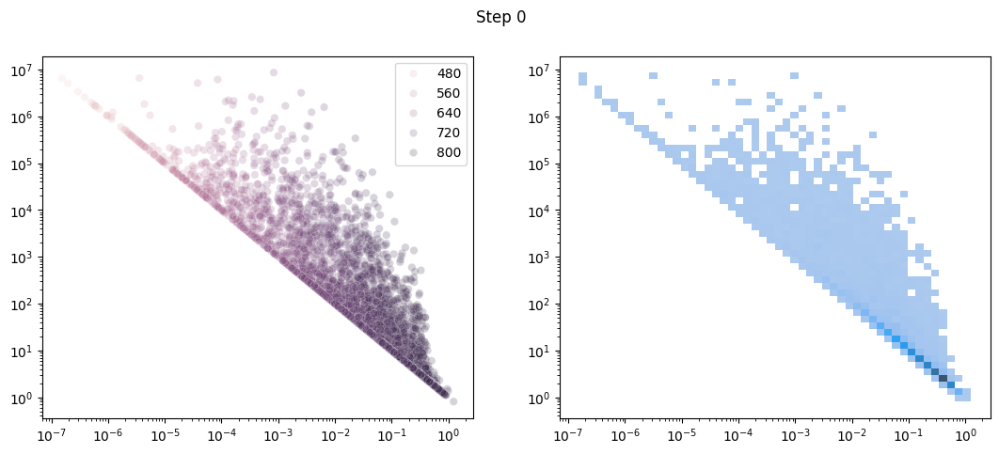

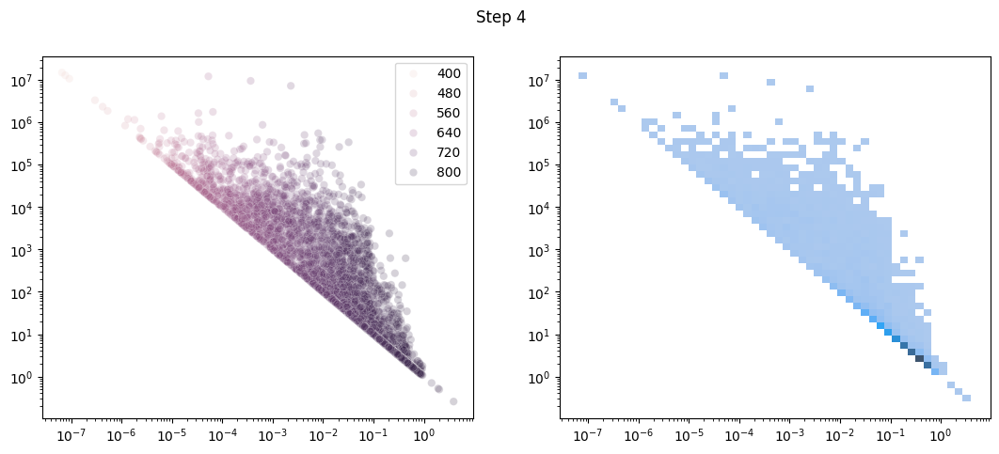

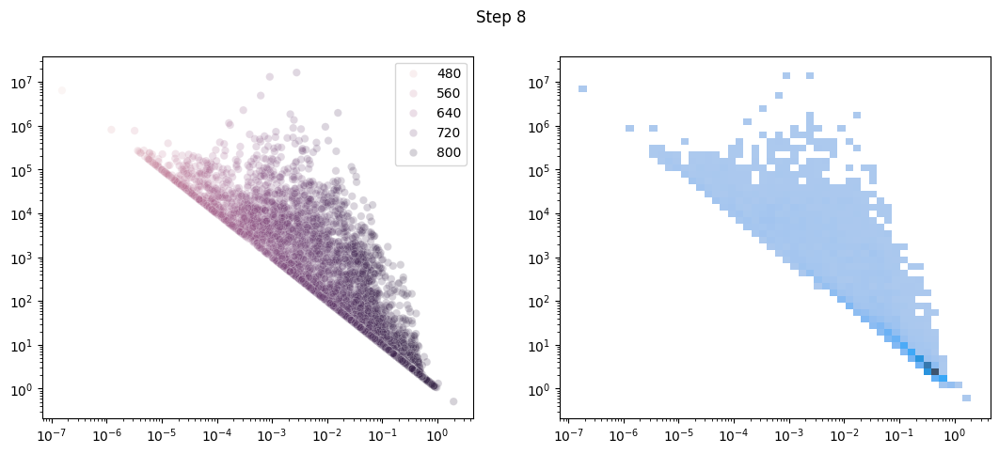

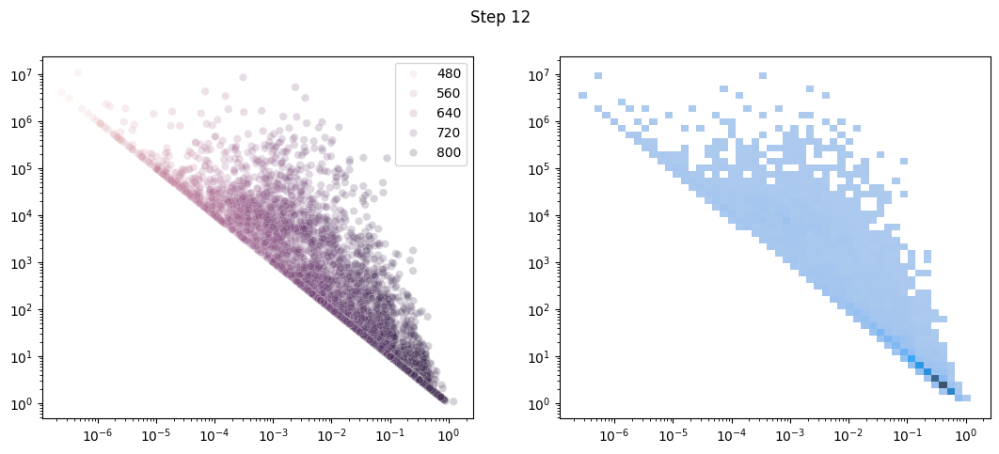

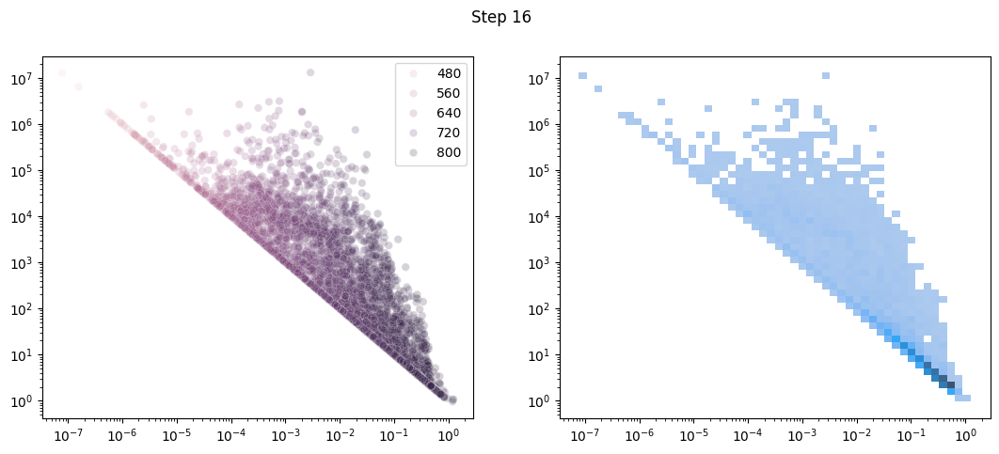

In [8]:
n_samples_per_parent = int(np.ceil(total_samples/choose_max))

# [total_steps, n_outputs, n_samples, n_reactions]
all_params_en = np.zeros((total_steps, *reverse_rates.shape))
all_params_eq = np.zeros((total_steps, *reverse_rates.shape))
all_params_rt = np.zeros((total_steps, *reverse_rates.shape))
all_is_parent = np.zeros((total_steps, total_samples), dtype=bool)
all_adaptability = np.zeros((total_steps, total_samples, len(species)))
all_sensitivity = np.zeros((total_steps, total_samples, len(species)))
all_precision = np.zeros((total_steps, total_samples, len(species)))

sim_func = jax.vmap(partial(bioreaction_sim_dfx_expanded,
                            t0=t0, t1=t1, dt0=dt0,
                            forward_rates=forward_rates,
                            inputs=inputs,
                            outputs=outputs,
                            solver=get_diffrax_solver(sim_method),
                            saveat=dfx.SaveAt(ts=jnp.linspace(t0, t1, 500)),
                            stepsize_controller=make_stepsize_controller(t0, t1, dt0, dt1, choice=stepsize_controller)))

curr_en = energies

if run_mc:
    for step in range(total_steps):

        print(f'\n\nStarting iteration {step+1} out of {total_steps}\n\n')

        curr_eq = jax.vmap(
            partial(equilibrium_constant_reparameterisation, initial=N0))(curr_en)
        _, curr_rt = eqconstant_to_rates(curr_eq, k_a)

        ys0, ts0, ys1, ts1 = simulate(
            y00, curr_rt, sim_func, t0, t1, tmax, batch_size, threshold_steady_state)
        next_idxs, adaptability, sensitivity, precision = choose_next(sol=(ys0, ys1), idxs_signal=idxs_signal, idxs_output=idxs_output,
                                                                    use_sensitivity_func1=use_sensitivity_func1, choose_max=choose_max, 
                                                                    total_samples=total_samples, diversity=diversity)
        print(f'Choosing {len(next_idxs)} next circuits')
        if len(next_idxs) < choose_max:
            print('Not enough circuits chosen, will randomly choose the rest')
            idxs_rnd = choose_next_rnd(choose_max - len(next_idxs), total_samples)
            next_idxs = jnp.concatenate([next_idxs, idxs_rnd])
        
        if np.mod(step, int(total_steps/5)) == 0:
            plt.figure(figsize=(13, 5))
            ax = plt.subplot(1, 2, 1)
            sns.scatterplot(x=sensitivity[..., idxs_output].flatten(), y=precision[..., idxs_output].flatten(), hue=adaptability[..., idxs_output].flatten(), alpha=0.2)
            plt.xscale('log')
            plt.yscale('log')
            ax = plt.subplot(1, 2, 2)
            sns.histplot(x=sensitivity[:, idxs_output].flatten(), y=precision[:, idxs_output].flatten(), bins=50, log_scale=[True, True])
            plt.suptitle(f'Step {step}')


        # Save results
        all_params_en[step] = curr_en
        all_params_eq[step] = curr_eq
        all_params_rt[step] = curr_rt
        all_is_parent[step][next_idxs] = True
        all_adaptability[step] = adaptability
        all_sensitivity[step] = sensitivity
        all_precision[step] = precision

        # Mutate energies
        next_en = mutate_expand(
            curr_en[next_idxs], n_samples_per_parent, mutation_scale)[:total_samples]
        print(f'Mutated and expanding {len(next_idxs)} into {len(next_en)} next circuits')
        curr_en = next_en

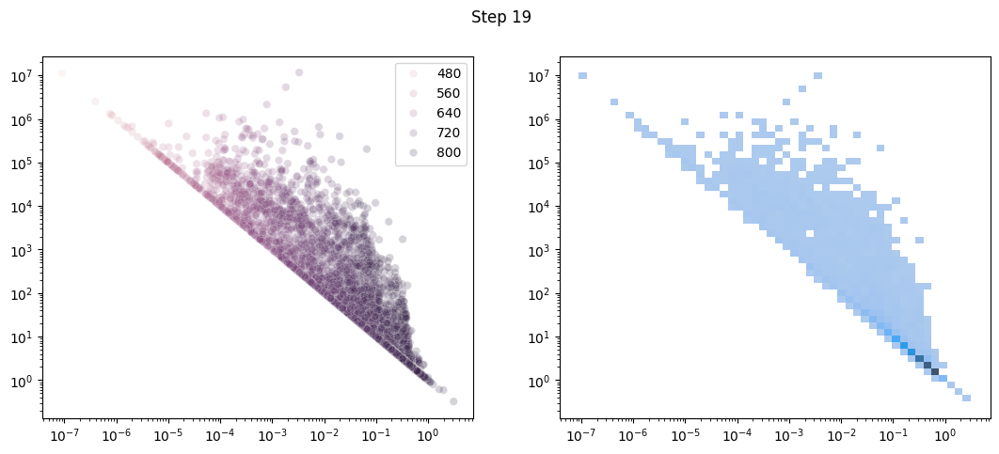

In [9]:
if run_mc:
    plt.figure(figsize=(13, 5))
    ax = plt.subplot(1, 2, 1)
    sns.scatterplot(x=sensitivity[..., idxs_output].flatten(), y=precision[..., idxs_output].flatten(), hue=adaptability[..., idxs_output].flatten(), alpha=0.2)
    plt.xscale('log')
    plt.yscale('log')
    ax = plt.subplot(1, 2, 2)
    sns.histplot(x=sensitivity[:, idxs_output].flatten(), y=precision[:, idxs_output].flatten(), bins=50, log_scale=[True, True])
    plt.suptitle(f'Step {step}')


# Visualise

In [10]:
fn_save = f'results/23_Monte_Carlo_adaptability_2/23_Monte_Carlo_adaptability_n{total_samples}.csv'
if os.path.exists(fn_save):
    d = pd.read_csv(fn_save)
    # if all_adaptability.sum() == 0:
    #     all_adaptability = np.array(d['Adaptability']).reshape(total_steps, total_samples, len(idxs_output))
    #     all_sensitivity = np.array(d['Sensitivity']).reshape(total_steps, total_samples, len(idxs_output))
    #     all_precision = np.array(d['Precision']).reshape(total_steps, total_samples, len(idxs_output))
else:
    d = pd.DataFrame(data={'Adaptability': all_adaptability[..., idxs_output].flatten(), 
                        'Sensitivity': all_sensitivity[..., idxs_output].flatten(), 
                        'Precision': all_precision[..., idxs_output].flatten(), 
                        'Is parent circuit': np.repeat(all_is_parent.flatten(), repeats=len(species_output)),
                        'Circuit idx': np.repeat(np.repeat(np.arange(total_samples), repeats=len(species_output)), repeats=total_steps),
                        'Species': flatten_listlike([[s] * total_samples for s in species_output] * total_steps),
                        'Step': np.repeat(np.arange(total_steps), repeats=total_samples*len(species_output)),
                        'Params energy': [l.tolist() for l in np.repeat(all_params_en.flatten(), repeats=len(species_output)).reshape(-1, energies.shape[-1])],
                        'Params equilibrium constants': [l.tolist() for l in np.repeat(all_params_eq.flatten(), repeats=len(species_output)).reshape(-1, energies.shape[-1])],
                        'Params rates': [l.tolist() for l in np.repeat(all_params_rt.flatten(), repeats=len(species_output)).reshape(-1, energies.shape[-1])]})

In [11]:
if not os.path.exists(fn_save):
    d.sort_values(by='Adaptability', ascending=False).to_csv(fn_save, index=False)


In [12]:
print(f'Number of adaptable circuits: {len(d[(d["Sensitivity"] > 1e0) & (d["Precision"] > 1e1)])}')

Number of adaptable circuits: 0


Maxima - Adaptability: 809.0350952148438, Sensitivity: 1.2347291707992554, Precision: inf
Maxima - Adaptability: 806.5621337890625, Sensitivity: 1.1289502382278442, Precision: inf


Maxima - Adaptability: 804.133544921875, Sensitivity: 0.9876071214675903, Precision: inf
Maxima - Adaptability: 807.2288818359375, Sensitivity: 1.8535898923873901, Precision: inf


Maxima - Adaptability: 815.2927856445312, Sensitivity: 3.9046356678009033, Precision: inf
Maxima - Adaptability: 808.9126586914062, Sensitivity: 1.5288909673690796, Precision: inf


Maxima - Adaptability: 804.09765625, Sensitivity: 1.635562777519226, Precision: inf
Maxima - Adaptability: 805.3865356445312, Sensitivity: 0.9297000169754028, Precision: inf


Maxima - Adaptability: 804.4122314453125, Sensitivity: 1.9666457176208496, Precision: inf
Maxima - Adaptability: 806.6358642578125, Sensitivity: 1.6664320230484009, Precision: inf


Maxima - Adaptability: 805.5382080078125, Sensitivity: 2.062450408935547, Precision: inf
Maxima - Adaptability: 810.6265869140625, Sensitivity: 1.672125220298767, Precision: inf


Maxima - Adaptability: 808.2838134765625, Sensitivity: 1.2147010564804077, Precision: inf
Maxima - Adaptability: 811.0127563476562, Sensitivity: 1.399652123451233, Precision: inf


Maxima - Adaptability: 810.7820434570312, Sensitivity: 0.8765527606010437, Precision: inf
Maxima - Adaptability: 803.433349609375, Sensitivity: 1.6538779735565186, Precision: inf


Maxima - Adaptability: 804.2018432617188, Sensitivity: 1.248974323272705, Precision: inf
Maxima - Adaptability: 807.8646850585938, Sensitivity: 1.6481491327285767, Precision: inf


Maxima - Adaptability: 801.9313354492188, Sensitivity: 1.3597991466522217, Precision: inf
Maxima - Adaptability: 813.5642700195312, Sensitivity: 3.099456548690796, Precision: inf


Text(0.5, 0.98, 'Monte Carlo sampling for higher adaptability')

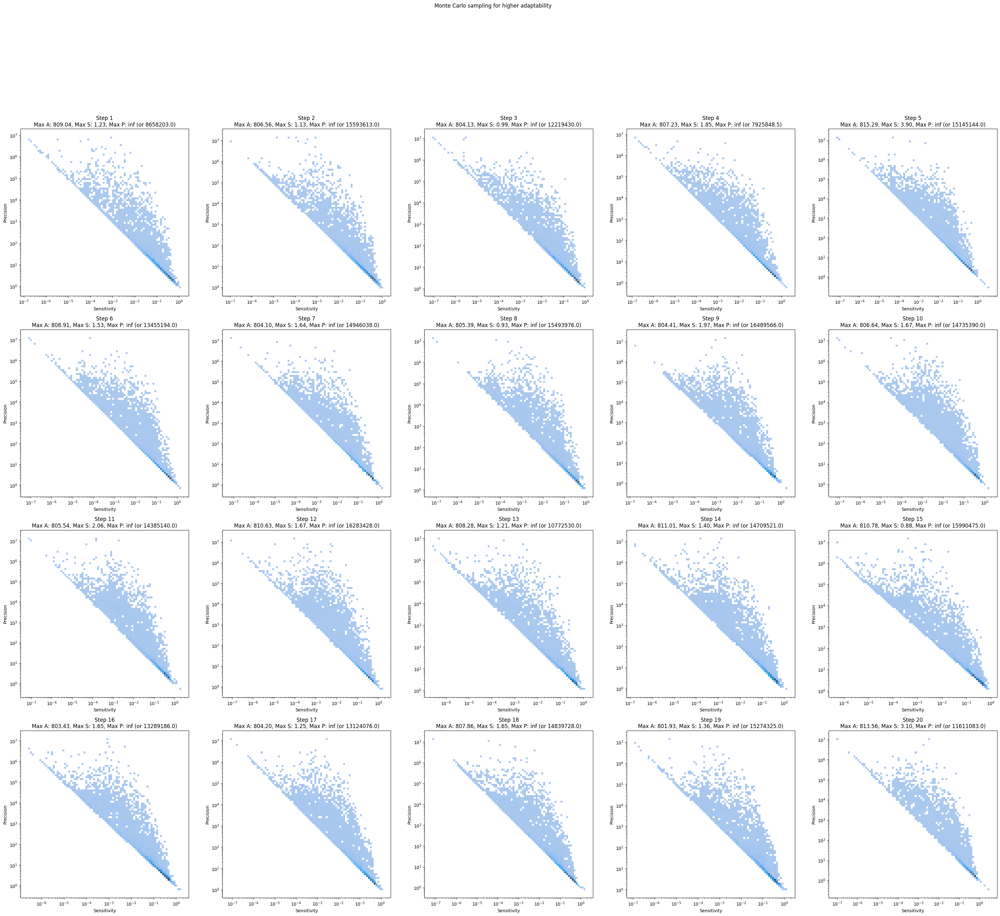

In [13]:
nc = int(np.ceil(np.sqrt(total_steps)))
nr = int(np.ceil(np.sqrt(total_steps)))
plt.figure(figsize=(8*nc, 8*nr))
# for step, (a, s, p) in enumerate(zip(all_adaptability, all_sensitivity, all_precision)):
for step in d['Step'].unique():
    filt = (d['Step'] == step) & (d['Species'].isin(species_output))
    
    print(f'Maxima - Adaptability: {np.nanmax(d[filt]["Adaptability"])}, Sensitivity: {np.nanmax(d[filt]["Sensitivity"])}, Precision: {np.nanmax(d[filt]["Precision"])}')
    
    ax = plt.subplot(nr, nc, step+1)
    # sns.scatterplot(d[filt], x='Sensitivity', y='Precision', hue='Adaptability', palette='viridis')
    # plt.xscale('log')
    # plt.yscale('log')
    sns.histplot(d[filt], x='Sensitivity', y='Precision', bins=80, log_scale=[True, True])
    plt.title(f'Step {step+1}\nMax A: {np.nanmax(d[filt]["Adaptability"]):.2f}, Max S: {np.nanmax(d[filt]["Sensitivity"]):.2f}, Max P: {np.nanmax(d[filt]["Precision"]):.2f} (or {np.nanmax(d[filt]["Precision"][d[filt]["Precision"] < np.inf])})')

plt.suptitle('Monte Carlo sampling for higher adaptability')

Text(0.5, 0.98, 'Monte Carlo sampling for higher adaptability')

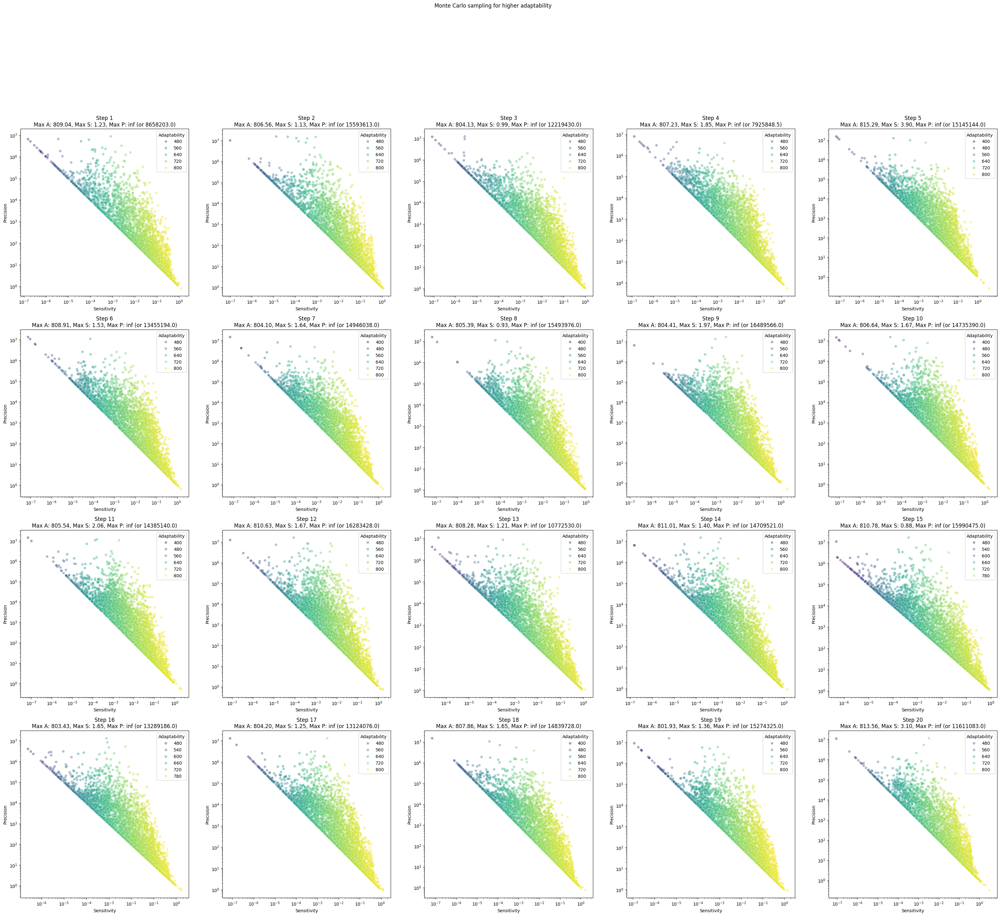

In [14]:
plt.figure(figsize=(8*nc, 8*nr))
for step in d['Step'].unique():
    filt = (d['Step'] == step) & (d['Species'].isin(species_output))
    
    ax = plt.subplot(nr, nc, step+1)
    sns.scatterplot(d[filt], x='Sensitivity', y='Precision', hue='Adaptability', palette='viridis', alpha=0.4)
    plt.xscale('log')
    plt.yscale('log')
    plt.title(f'Step {step+1}\nMax A: {np.nanmax(d[filt]["Adaptability"]):.2f}, Max S: {np.nanmax(d[filt]["Sensitivity"]):.2f}, Max P: {np.nanmax(d[filt]["Precision"]):.2f} (or {np.nanmax(d[filt]["Precision"][d[filt]["Precision"] < np.inf])})')

plt.suptitle('Monte Carlo sampling for higher adaptability')

Text(0.5, 0.98, 'Monte Carlo sampling for higher adaptability')

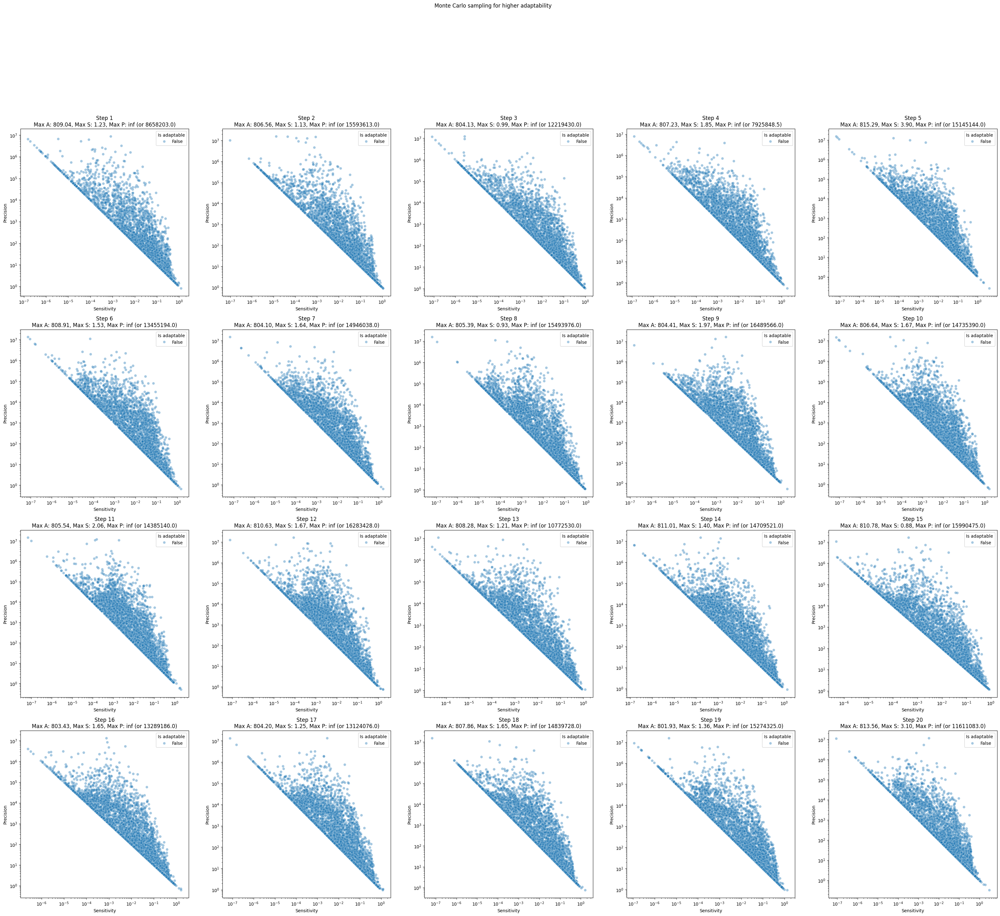

In [15]:
d['Is adaptable'] = (d['Sensitivity'] > 1e0) & (d['Precision'] > 1e1)
plt.figure(figsize=(8*nc, 8*nr))
for step in d['Step'].unique():
    filt = (d['Step'] == step) & (d['Species'].isin(species_output))
    
    ax = plt.subplot(nr, nc, step+1)
    sns.scatterplot(d[filt], x='Sensitivity', y='Precision', hue='Is adaptable', alpha=0.4)
    plt.xscale('log')
    plt.yscale('log')
    plt.title(f'Step {step+1}\nMax A: {np.nanmax(d[filt]["Adaptability"]):.2f}, Max S: {np.nanmax(d[filt]["Sensitivity"]):.2f}, Max P: {np.nanmax(d[filt]["Precision"]):.2f} (or {np.nanmax(d[filt]["Precision"][d[filt]["Precision"] < np.inf])})')

plt.suptitle('Monte Carlo sampling for higher adaptability')

Text(0.5, 0.98, 'Monte Carlo sampling for higher adaptability')

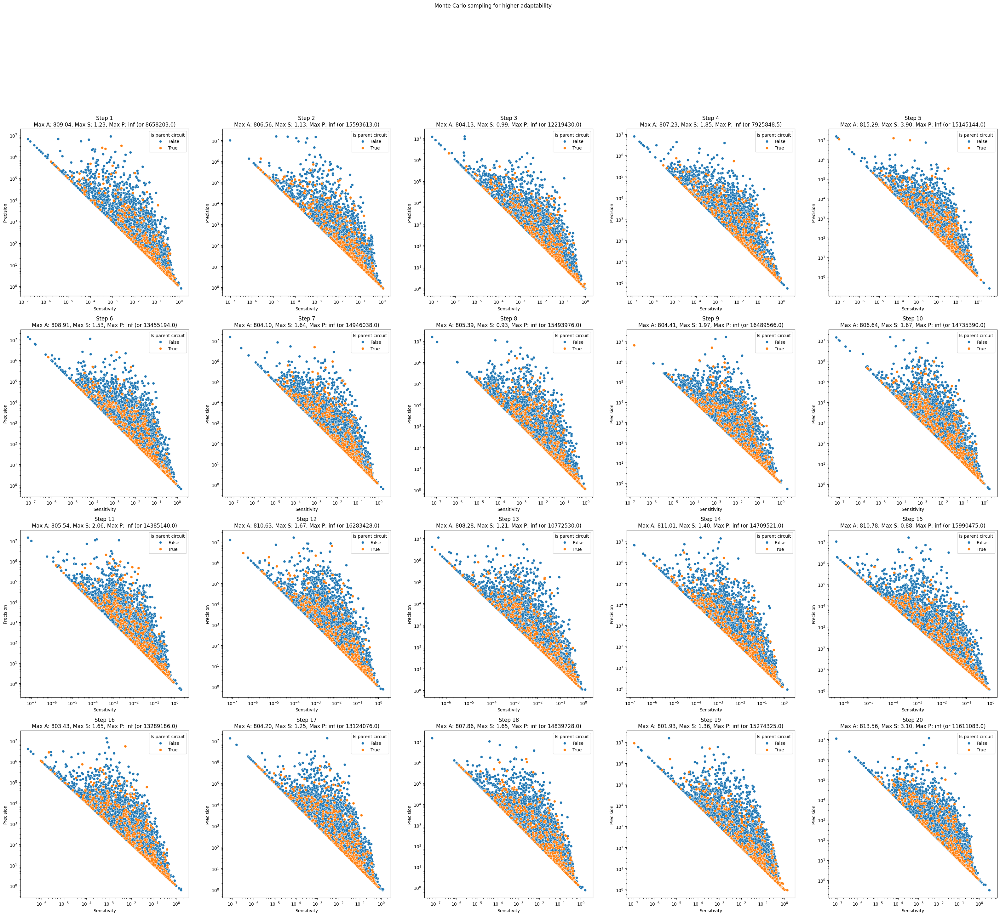

In [16]:
plt.figure(figsize=(8*nc, 8*nr))
for step in d['Step'].unique():
    filt = (d['Step'] == step) & (d['Species'].isin(species_output))
    ax = plt.subplot(nr, nc, step+1)
    sns.scatterplot(d[filt].sort_values(by='Is parent circuit'), x='Sensitivity', y='Precision', hue='Is parent circuit')
    plt.xscale('log')
    plt.yscale('log')
    plt.title(f'Step {step+1}\nMax A: {np.nanmax(d[filt]["Adaptability"]):.2f}, Max S: {np.nanmax(d[filt]["Sensitivity"]):.2f}, Max P: {np.nanmax(d[filt]["Precision"]):.2f} (or {np.nanmax(d[filt]["Precision"][d[filt]["Precision"] < np.inf])})')

plt.suptitle('Monte Carlo sampling for higher adaptability')

## Visualise histograms

Text(0.5, 1.0, 'Precision')

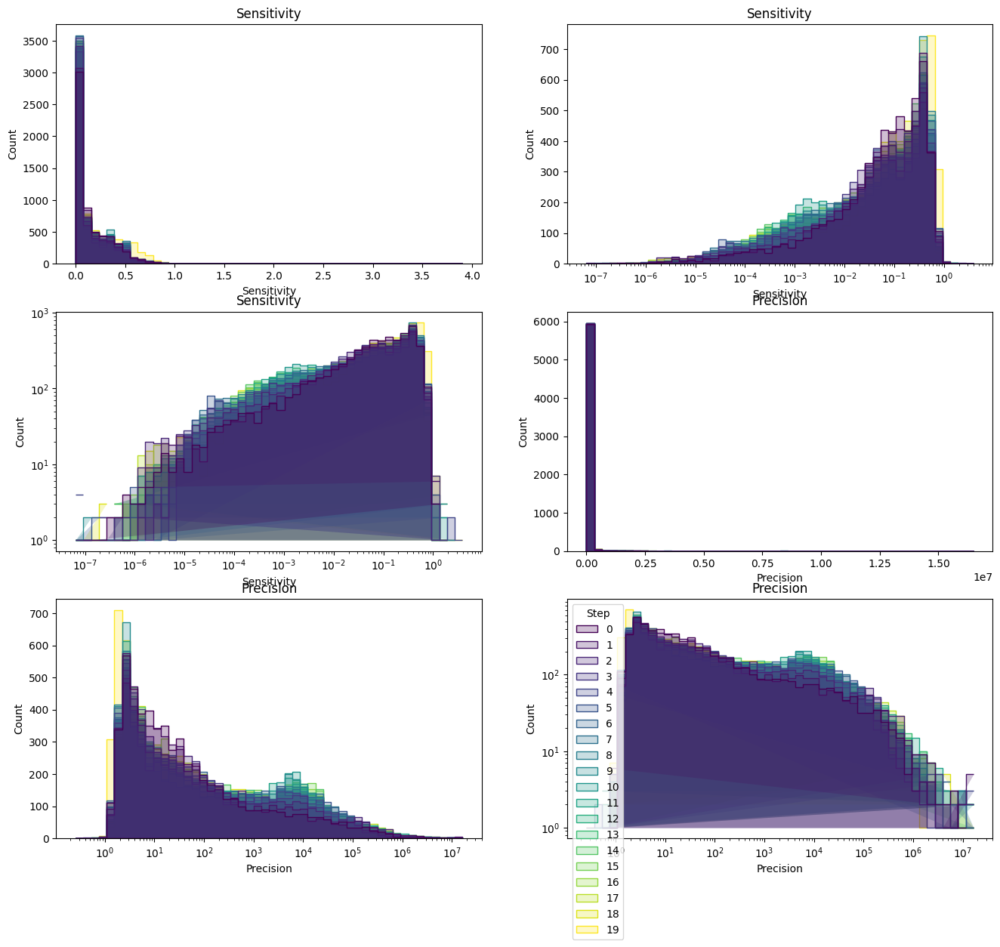

In [17]:
fig = plt.figure(figsize=(8*2, 7*2))
ax = plt.subplot(3, 2, 1)
sns.histplot(d[d['Species'].isin(species_output)], x='Sensitivity', hue='Step', log_scale=[False, False], bins=50, element='step', palette='viridis', legend=False)
plt.title('Sensitivity')
ax = plt.subplot(3, 2, 2)
sns.histplot(d[d['Species'].isin(species_output)], x='Sensitivity', hue='Step', log_scale=[True, False], bins=50, element='step', palette='viridis', legend=False)
plt.title('Sensitivity')
ax = plt.subplot(3, 2, 3)
sns.histplot(d[d['Species'].isin(species_output)], x='Sensitivity', hue='Step', log_scale=[True, True], bins=50, element='step', palette='viridis', legend=False)
plt.title('Sensitivity')
ax = plt.subplot(3, 2, 4)
sns.histplot(d[d['Species'].isin(species_output)], x='Precision', hue='Step', log_scale=[False, False], bins=50, element='step', palette='viridis', legend=False)
plt.title('Precision')
ax = plt.subplot(3, 2, 5)
sns.histplot(d[d['Species'].isin(species_output)], x='Precision', hue='Step', log_scale=[True, False], bins=50, element='step', palette='viridis', legend=False)
plt.title('Precision')
ax = plt.subplot(3, 2, 6)
sns.histplot(d[d['Species'].isin(species_output)], x='Precision', hue='Step', log_scale=[True, True], bins=50, element='step', palette='viridis', legend=True)
plt.title('Precision')


In [18]:
d.sort_values(by='Adaptability', ascending=False).head(10)

,Adaptability,Sensitivity,Precision,Is parent circuit,Circuit idx,Species,Step,Params energy,Params equilibrium constants,Params rates,Is adaptable
27016,815.292786,0.435591,620.585693,False,1350,RNA_2,4,"[-2.8093221187591553, -20.740163803100586, -24...","[1.5873501979513094e-05, 26.945444107055664, 8...","[95.10069274902344, 5.602361125056632e-05, 1.8...",False
117222,813.564270,0.324309,1723.344604,False,5861,RNA_2,19,"[-2.410651922225952, -11.300851821899414, -10....","[1.1538793842191808e-05, 0.014155726879835129,...","[130.8265838623047, 0.1066410019993782, 0.2548...",False
28818,811.322815,3.904636,0.256106,False,1440,RNA_2,4,"[-17.824581146240234, -24.988161087036133, -2....","[2.6152184009552, 806.1030883789062, 1.0345198...","[0.000577229424379766, 1.872689722404175e-06, ...",False
83116,811.012756,0.225177,6620.959961,False,4155,RNA_2,13,"[-6.561007976531982, -13.875086784362793, -9.8...","[0.00031925796065479517, 0.11099747568368912, ...","[4.728405475616455, 0.013600138947367668, 0.33...",False
85042,810.782043,0.404757,298.085510,False,4252,RNA_2,14,"[-2.2235937118530273, -21.445858001708984, -21...","[9.935040907294024e-06, 47.38801574707031, 72....","[151.9451141357422, 3.185575405950658e-05, 2.0...",False
70232,810.626587,0.338631,651.649231,False,3511,RNA_2,11,"[-1.0279359817504883, -0.6217264533042908, -10...","[3.817293872998562e-06, 2.7581877475313377e-06...","[395.45843505859375, 547.3090209960938, 0.2238...",False
68432,810.574646,0.298435,1200.613159,False,3421,RNA_2,11,"[-0.8078801035881042, -0.6541535258293152, -9....","[3.2011089388106484e-06, 2.8306778858677717e-0...","[471.5806579589844, 533.2931518554688, 0.31799...",False
82516,810.194336,0.209009,8185.981934,False,4125,RNA_2,13,"[-7.0203118324279785, -12.993095397949219, -9....","[0.00046102050691843033, 0.05481228232383728, ...","[3.2744333744049072, 0.02754092775285244, 0.36...",False
69632,809.817139,0.259225,2058.720703,False,3481,RNA_2,11,"[-0.8535369634628296, -0.7062318325042725, -9....","[3.3201915812242078e-06, 2.9511027150874725e-0...","[454.6668395996094, 511.5311584472656, 0.45054...",False
115902,809.049500,3.099457,0.322648,False,5795,RNA_2,19,"[-18.967954635620117, -24.988161087036133, -9....","[6.527645111083984, 806.1030883789062, 0.00234...","[0.00023125966254156083, 1.872689722404175e-06...",False
